In [23]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics.pairwise import cosine_similarity

In [3]:
df = pd.read_csv('Psittaciformes.csv',
                 on_bad_lines='skip',
                 encoding='utf-8',
                 dtype=str,  # Read all as string first
                 skip_blank_lines=True,
                 header=0,
                 skipinitialspace=True)

In [4]:
print(df.columns)

Index(['scientificName', 'kingdomName', 'phylumName', 'className', 'orderName',
       'familyName', 'genusName', 'speciesName', 'redlistCategory',
       'redlistCriteria', 'yearPublished', 'assessmentDate', 'criteriaVersion',
       'language', 'populationTrend', 'systems', 'realm', 'yearLastSeen',
       'possiblyExtinct', 'possiblyExtinctInTheWild', 'scopes', 'Sequence',
       'Avibase.ID1', 'Total.individuals', 'Female', 'Male', 'Unknown',
       'Complete.measures', 'Beak.Length_Culmen', 'Beak.Length_Nares',
       'Beak.Width', 'Beak.Depth', 'Tarsus.Length', 'Wing.Length',
       'Kipps.Distance', 'Secondary1', 'Hand-Wing.Index', 'Tail.Length',
       'Mass', 'Mass.Source', 'Mass.Refs.Other', 'Inference',
       'Traits.inferred', 'Reference.species', 'Habitat', 'Habitat.Density',
       'Migration', 'Trophic.Level', 'Trophic.Niche', 'Primary.Lifestyle',
       'Min.Latitude', 'Max.Latitude', 'Centroid.Latitude',
       'Centroid.Longitude', 'Range.Size', 'internalTaxonId_x', '

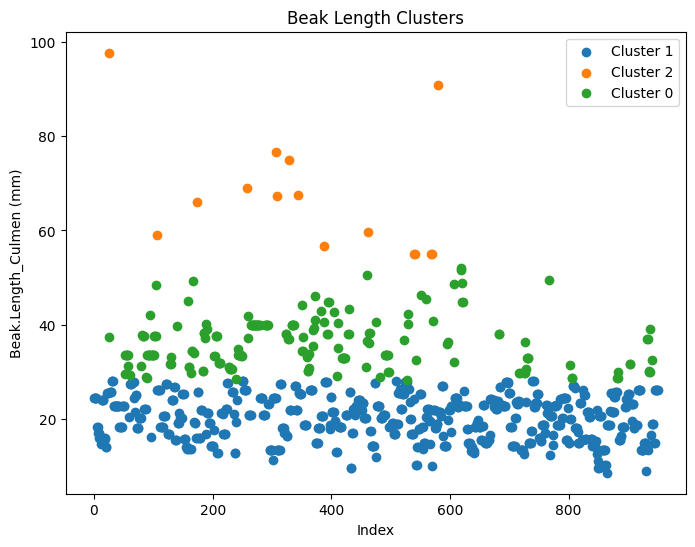

In [9]:
#Group each bird by beak length culmen

# Load the data
def load_bird_data(file_path):
    """Loads the bird data from a CSV file."""
    try:
        data = pd.read_csv(file_path)
        if "Beak.Length_Culmen" not in data.columns:
            raise KeyError("The column 'Beak.Length_Culmen' is missing from the dataset.")
        return data
    except Exception as e:
        print(f"Error loading data: {e}")
        return None

# Perform clustering
def cluster_birds(data, num_clusters=3):
    """Groups birds into clusters based on Beak.Length_Culmen."""
    culmen_values = data[["Beak.Length_Culmen"]].dropna()  # Drop missing values

    # Fit the K-Means model
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    culmen_values["Cluster"] = kmeans.fit_predict(culmen_values)

    # Merge clusters back to original data
    clustered_data = data.merge(culmen_values, on="Beak.Length_Culmen", how="left")
    return clustered_data, kmeans

# Visualize clusters
def visualize_clusters(clustered_data):
    """Visualizes the clusters of Beak.Length_Culmen."""
    plt.figure(figsize=(8, 6))
    for cluster in clustered_data["Cluster"].unique():
        cluster_data = clustered_data[clustered_data["Cluster"] == cluster]
        plt.scatter(cluster_data.index, cluster_data["Beak.Length_Culmen"], label=f"Cluster {cluster}")

    plt.xlabel("Index")
    plt.ylabel("Beak.Length_Culmen (mm)")
    plt.title("Beak Length Clusters")
    plt.legend()
    plt.show()

# Main function
def main():
    file_path = "Psittaciformes.csv"
    bird_data = load_bird_data(file_path)

    if bird_data is not None:
        num_clusters = 3  # Change as needed
        clustered_data, kmeans = cluster_birds(bird_data, num_clusters=num_clusters)

        # Visualize the clusters
        visualize_clusters(clustered_data)

if __name__ == "__main__":
    main()


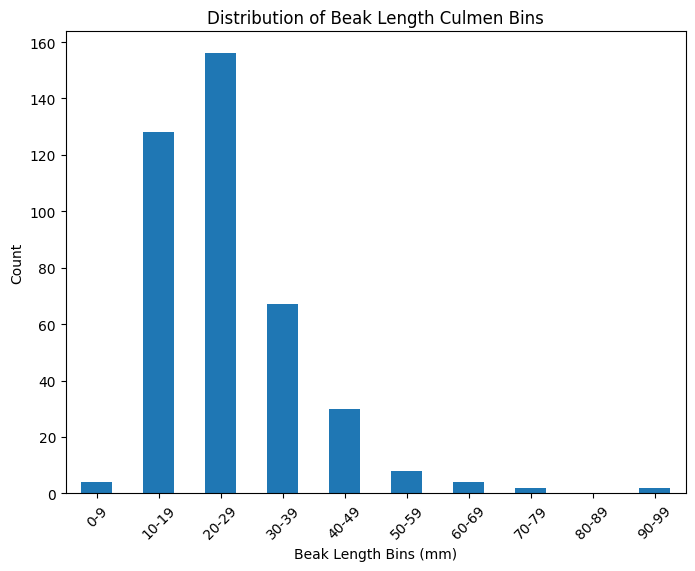

In [14]:
# Group data into bins
def group_birds_by_bins(data, bin_size=10):
    """Groups birds into bins based on Beak.Length_Culmen."""
    bin_edges = range(0, int(data["Beak.Length_Culmen"].max()) + bin_size, bin_size)
    bin_labels = [f"{bin_edges[i]}-{bin_edges[i+1]-1}" for i in range(len(bin_edges)-1)]
    data["Beak_Length_Bin"] = pd.cut(data["Beak.Length_Culmen"], bins=bin_edges, labels=bin_labels, right=False)
    return data

# Visualize bins
def visualize_bins(grouped_data):
    """Visualizes the distribution of Beak.Length_Culmen bins."""
    bin_counts = grouped_data["Beak_Length_Bin"].value_counts().sort_index()

    plt.figure(figsize=(8, 6))
    bin_counts.plot(kind="bar")
    plt.xlabel("Beak Length Bins (mm)")
    plt.ylabel("Count")
    plt.title("Distribution of Beak Length Culmen Bins")
    plt.xticks(rotation=45)
    plt.show()


file_path = "Psittaciformes.csv"  # Replace with your file path
bird_data = load_bird_data(file_path)

if bird_data is not None:
  bin_size = 10  # Change as needed
  grouped_data = group_birds_by_bins(bird_data, bin_size=bin_size)
  # Visualize the bins
  visualize_bins(grouped_data)

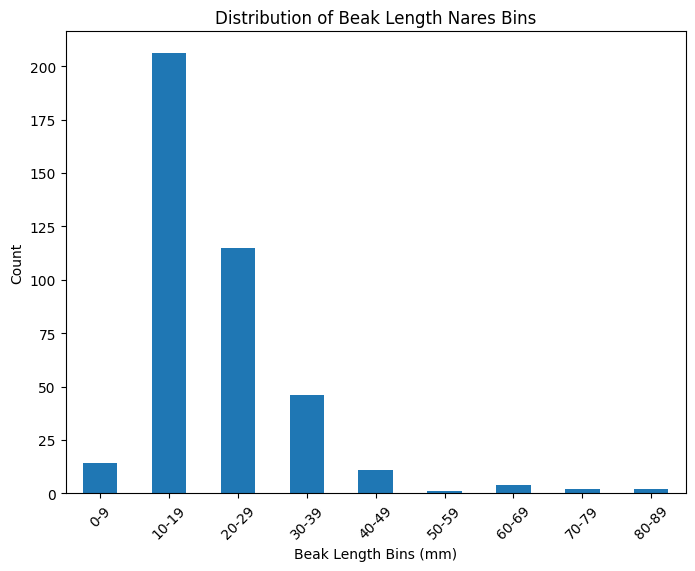

In [15]:
# Group data into bins
def group_birds_by_bins(data, bin_size=10):
    """Groups birds into bins based on Beak.Length_Nares."""
    bin_edges = range(0, int(data["Beak.Length_Nares"].max()) + bin_size, bin_size)
    bin_labels = [f"{bin_edges[i]}-{bin_edges[i+1]-1}" for i in range(len(bin_edges)-1)]
    data["Beak_Length_Bin"] = pd.cut(data["Beak.Length_Nares"], bins=bin_edges, labels=bin_labels, right=False)
    return data

# Visualize bins
def visualize_bins(grouped_data):
    """Visualizes the distribution of Beak.Length_Culmen bins."""
    bin_counts = grouped_data["Beak_Length_Bin"].value_counts().sort_index()

    plt.figure(figsize=(8, 6))
    bin_counts.plot(kind="bar")
    plt.xlabel("Beak Length Bins (mm)")
    plt.ylabel("Count")
    plt.title("Distribution of Beak Length Nares Bins")
    plt.xticks(rotation=45)
    plt.show()


file_path = "Psittaciformes.csv"  # Replace with your file path
bird_data = load_bird_data(file_path)

if bird_data is not None:
  bin_size = 10  # Change as needed
  grouped_data = group_birds_by_bins(bird_data, bin_size=bin_size)
  # Visualize the bins
  visualize_bins(grouped_data)

<ipython-input-18-33ded9069798>:11: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = grouped_data.pivot_table(index="Beak_Length_Bin", columns="redlistCategory", aggfunc="size", fill_value=0)


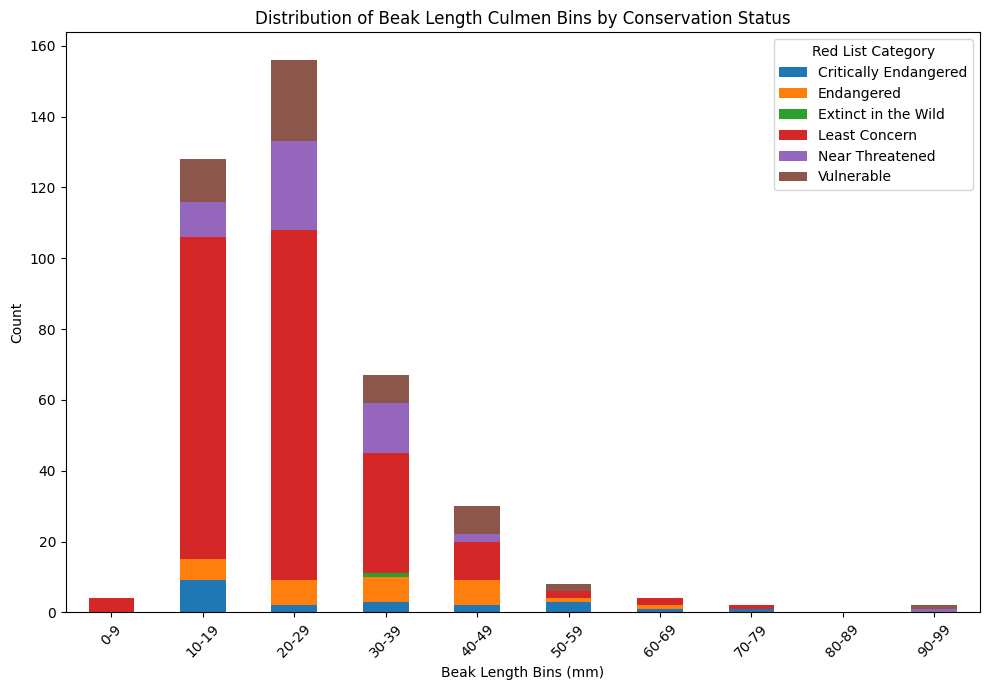

In [18]:
# Group data into bins
def group_birds_by_bins(data, bin_size=10):
    """Groups birds into bins based on Beak.Length_Culmen."""
    bin_edges = range(0, int(data["Beak.Length_Culmen"].max()) + bin_size, bin_size)
    bin_labels = [f"{bin_edges[i]}-{bin_edges[i+1]-1}" for i in range(len(bin_edges)-1)]
    data["Beak_Length_Bin"] = pd.cut(data["Beak.Length_Culmen"], bins=bin_edges, labels=bin_labels, right=False)
    return data

def visualize_bins_with_status(grouped_data):
    """Visualizes the distribution of Beak.Length_Culmen bins with conservation status as a stacked bar plot."""
    pivot_table = grouped_data.pivot_table(index="Beak_Length_Bin", columns="redlistCategory", aggfunc="size", fill_value=0)

    pivot_table.plot(kind="bar", stacked=True, figsize=(10, 7))
    plt.xlabel("Beak Length Bins (mm)")
    plt.ylabel("Count")
    plt.title("Distribution of Beak Length Culmen Bins by Conservation Status")
    plt.xticks(rotation=45)
    plt.legend(title="Red List Category")
    plt.tight_layout()
    plt.show()

file_path = "Psittaciformes.csv"  # Replace with your file path
bird_data = load_bird_data(file_path)

if bird_data is not None:
      bin_size = 10  # Change as needed
      grouped_data = group_birds_by_bins(bird_data, bin_size=bin_size)

      # Visualize the bins with conservation status
      visualize_bins_with_status(grouped_data)

<ipython-input-17-0044d673f7d2>:12: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = grouped_data.pivot_table(index="Beak_Length_Bin", columns="redlistCategory", aggfunc="size", fill_value=0)


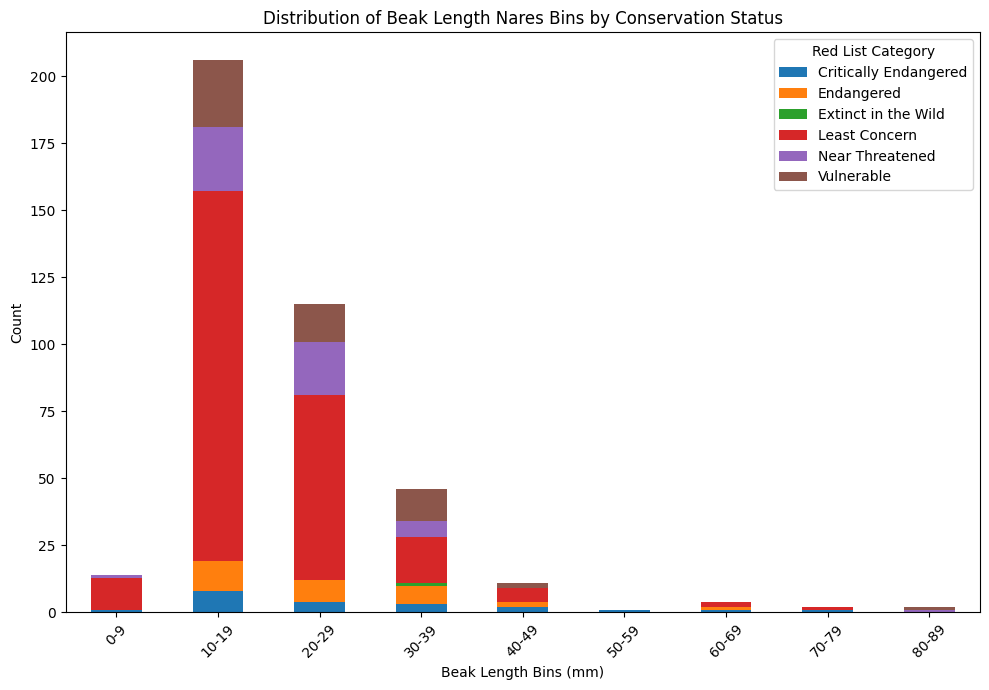

In [17]:
# Group data into bins
def group_birds_by_bins(data, bin_size=10):
    """Groups birds into bins based on Beak.Length_Nares."""
    bin_edges = range(0, int(data["Beak.Length_Nares"].max()) + bin_size, bin_size)
    bin_labels = [f"{bin_edges[i]}-{bin_edges[i+1]-1}" for i in range(len(bin_edges)-1)]
    data["Beak_Length_Bin"] = pd.cut(data["Beak.Length_Nares"], bins=bin_edges, labels=bin_labels, right=False)
    return data


def visualize_bins_with_status(grouped_data):
    """Visualizes the distribution of Beak.Length_Nares bins with conservation status as a stacked bar plot."""
    pivot_table = grouped_data.pivot_table(index="Beak_Length_Bin", columns="redlistCategory", aggfunc="size", fill_value=0)

    pivot_table.plot(kind="bar", stacked=True, figsize=(10, 7))
    plt.xlabel("Beak Length Bins (mm)")
    plt.ylabel("Count")
    plt.title("Distribution of Beak Length Nares Bins by Conservation Status")
    plt.xticks(rotation=45)
    plt.legend(title="Red List Category")
    plt.tight_layout()
    plt.show()

file_path = "Psittaciformes.csv"  # Replace with your file path
bird_data = load_bird_data(file_path)

if bird_data is not None:
      bin_size = 10  # Change as needed
      grouped_data = group_birds_by_bins(bird_data, bin_size=bin_size)

      # Visualize the bins with conservation status
      visualize_bins_with_status(grouped_data)

In [21]:

traits = [
    'Beak.Length_Culmen',
    'Beak.Length_Nares',
    'Beak.Width',
    'Beak.Depth',
    'Tarsus.Length',
    'Wing.Length',
    'Kipps.Distance',
    'Hand-Wing.Index',
    'Tail.Length',
    'Mass'
]




def standardize_traits(df_traits, traits):
    """Standardize/Normalize morphological traits."""
    scaler = StandardScaler()
    standardized_traits = scaler.fit_transform(df_traits[traits])
    species_names = df_traits['scientificName'].values
    return standardized_traits, species_names

def compute_similarity(standardized_traits):
    """
    Compute cosine similarity between species and ensure values are in [-1,1] range.

    Parameters:
        standardized_traits: numpy array of standardized morphological traits
    Returns:
        similarity_matrix: numpy array of pairwise similarities
    """
    # Compute cosine similarity
    similarity_matrix = cosine_similarity(standardized_traits)

    # Clip values to ensure they're in [-1,1] range
    similarity_matrix = np.clip(similarity_matrix, -1, 1)

    # Additional checks
    print("Similarity matrix range:",
          f"min: {similarity_matrix.min():.3f}, max: {similarity_matrix.max():.3f}")

    # Verify similarity range
    if not np.all((similarity_matrix >= -1) & (similarity_matrix <= 1)):
        print("Warning: Original similarity values were outside [-1,1] range")

    return similarity_matrix

In [24]:

# 1. Data Preparation
# Create a copy of the data with species names and morphological traits
# Drop any rows with missing values (NaN)
df_traits = df[['scientificName'] + traits].copy()
df_traits = df_traits.dropna()

# 2. Data Standardization
# StandardScaler transforms features to have mean=0 and variance=1
# This ensures all traits contribute equally regardless of their original scales
standardized_traits, species_names = standardize_traits(df_traits, traits)

# 3. Similarity Calculation
# Compute cosine similarity between all pairs of species
# Result is a square matrix where each cell[i,j] is similarity between species i and j
similarity_matrix = compute_similarity(standardized_traits)

Similarity matrix range: min: -0.989, max: 1.000


In [25]:
print(similarity_matrix)

[[ 1.          0.56027006  0.04976906 ... -0.36490797 -0.3297792
  -0.45884352]
 [ 0.56027006  1.          0.79320383 ...  0.44433952  0.46176515
   0.12800569]
 [ 0.04976906  0.79320383  1.         ...  0.87771725  0.90401756
   0.48635441]
 ...
 [-0.36490797  0.44433952  0.87771725 ...  1.          0.9828894
   0.74798991]
 [-0.3297792   0.46176515  0.90401756 ...  0.9828894   1.
   0.64177229]
 [-0.45884352  0.12800569  0.48635441 ...  0.74798991  0.64177229
   1.        ]]


In [28]:
traits = [
    'Beak.Length_Culmen',
    'Beak.Length_Nares',
    'Beak.Width',
    'Beak.Depth',
    'Tarsus.Length',
    'Wing.Length',
    'Kipps.Distance',
    'Hand-Wing.Index',
    'Tail.Length',
    'Mass'
]

from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def standardize_traits(df_traits, traits):
    """Standardize/Normalize morphological traits."""
    scaler = StandardScaler()
    standardized_traits = scaler.fit_transform(df_traits[traits])
    species_names = df_traits['scientificName'].values
    return standardized_traits, species_names

def compute_similarity(standardized_traits):
    """
    Compute cosine similarity between species and ensure values are in [-1,1] range.

    Parameters:
        standardized_traits: numpy array of standardized morphological traits
    Returns:
        similarity_matrix: numpy array of pairwise similarities
    """
    # Compute cosine similarity
    similarity_matrix = cosine_similarity(standardized_traits)

    # Clip values to ensure they're in [-1,1] range
    similarity_matrix = np.clip(similarity_matrix, -1, 1)

    # Additional checks
    print("Similarity matrix range:",
          f"min: {similarity_matrix.min():.3f}, max: {similarity_matrix.max():.3f}")

    # Verify similarity range
    if not np.all((similarity_matrix >= -1) & (similarity_matrix <= 1)):
        print("Warning: Original similarity values were outside [-1,1] range")

    return similarity_matrix

def find_similar_birds(similarity_matrix, species_names, df_traits, n_similar=4):
    """Find the most similar birds and their conservation status."""
    similar_birds_info = []

    for i, species in enumerate(species_names):
        # Get similarity scores for the current species
        similarities = similarity_matrix[i]

        # Exclude itself by setting its similarity to -inf
        similarities[i] = -np.inf

        # Find indices of the n most similar species
        similar_indices = np.argsort(similarities)[-n_similar:][::-1]

        # Get species names and conservation statuses
        similar_species = species_names[similar_indices]
        statuses = df_traits.loc[df_traits['scientificName'].isin(similar_species), 'redlistCategory'].values

        # Get the conservation status of the target species
        target_status = df_traits.loc[df_traits['scientificName'] == species, 'redlistCategory'].values[0]

        # Store results
        similar_birds_info.append({
            'Species': species,
            'Similar_Birds': list(similar_species),
            'Target_Status': target_status,
            'Conservation_Statuses': list(statuses)
        })

    return similar_birds_info

# 1. Data Preparation
# Create a copy of the data with species names and morphological traits
# Drop any rows with missing values (NaN)
df_traits = df[['scientificName', 'redlistCategory'] + traits].copy()
df_traits = df_traits.dropna()

# 2. Data Standardization
# StandardScaler transforms features to have mean=0 and variance=1
# This ensures all traits contribute equally regardless of their original scales
standardized_traits, species_names = standardize_traits(df_traits, traits)

# 3. Similarity Calculation
# Compute cosine similarity between all pairs of species
# Result is a square matrix where each cell[i,j] is similarity between species i and j
similarity_matrix = compute_similarity(standardized_traits)

# 4. Find similar birds and their conservation statuses
similar_birds_info = find_similar_birds(similarity_matrix, species_names, df_traits)

# 5. Display results
for info in similar_birds_info:
    print(f"Species: {info['Species']}")
    print(f"  Similar Birds: {', '.join(info['Similar_Birds'])}")
    print(f"  Target Conservation Status: {info['Target_Status']}")
    print(f"  Conservation Statuses: {', '.join(info['Conservation_Statuses'])}")
    print()

Similarity matrix range: min: -0.989, max: 1.000
Species: Eos histrio
  Similar Birds: Eos reticulata, Chalcopsitta cardinalis, Eos cyanogenia, Trichoglossus haematodus
  Target Conservation Status: Endangered
  Conservation Statuses: Least Concern, Near Threatened, Near Threatened, Least Concern

Species: Trichoglossus euteles
  Similar Birds: Glossopsitta concinna, Lathamus discolor, Trichoglossus chlorolepidotus, Psitteuteles goldiei
  Target Conservation Status: Least Concern
  Conservation Statuses: Least Concern, Critically Endangered, Least Concern, Least Concern

Species: Trichoglossus johnstoniae
  Similar Birds: Agapornis canus, Loriculus catamene, Psilopsiagon aurifrons, Loriculus pusillus
  Target Conservation Status: Near Threatened
  Conservation Statuses: Near Threatened, Least Concern, Near Threatened, Least Concern

Species: Vini australis
  Similar Birds: Charmosyna amabilis, Glossopsitta porphyrocephala, Melopsittacus undulatus, Glossopsitta pusilla
  Target Conserva

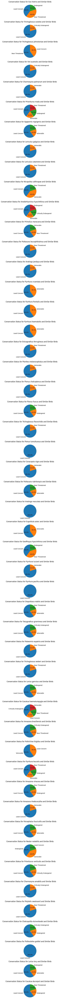

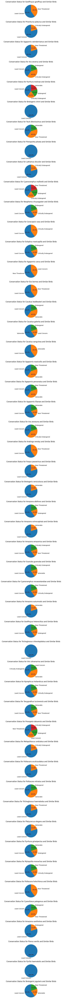

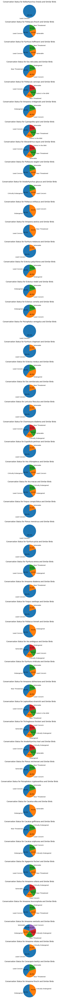

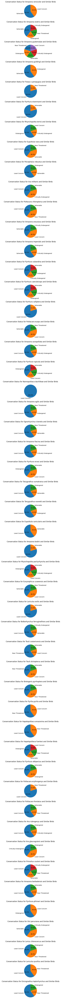

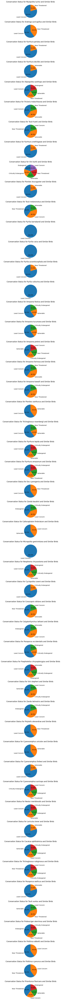

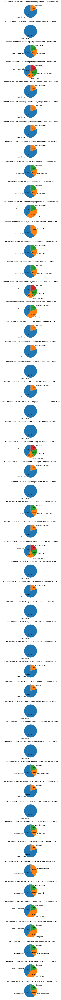

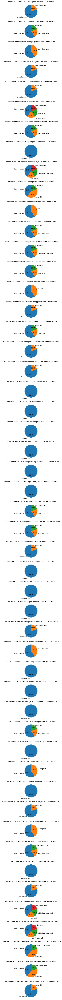

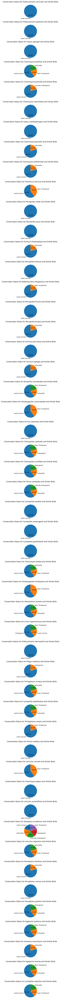

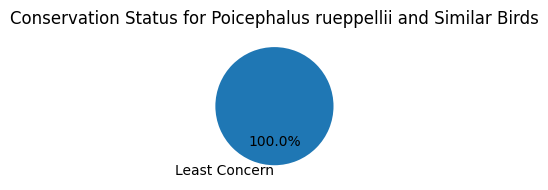

In [33]:
def visualize_similar_birds(similar_birds_info, birds_per_figure=50):
    """
    Visualize groups of similar birds and their conservation statuses as pie charts.

    Splits the visualization into multiple figures to avoid creating an image that's too large.
    """
    num_figures = int(np.ceil(len(similar_birds_info) / birds_per_figure))

    for fig_num in range(num_figures):
        start_index = fig_num * birds_per_figure
        end_index = min((fig_num + 1) * birds_per_figure, len(similar_birds_info))
        current_birds_info = similar_birds_info[start_index:end_index]

        fig, axes = plt.subplots(len(current_birds_info), 1,
                                 figsize=(8, len(current_birds_info) * 2))

        if len(current_birds_info) == 1:
            axes = [axes]

        for ax, info in zip(axes, current_birds_info):
            species = info['Species']
            similar_birds = info['Similar_Birds']
            statuses = info['Conservation_Statuses']
            target_status = info['Target_Status']

            # Combine target and similar birds
            all_birds = [species] + similar_birds
            all_statuses = [target_status] + statuses

            # Count occurrences of each redlist category
            status_counts = pd.Series(all_statuses).value_counts()

            # Plot pie chart
            ax.pie(status_counts, labels=status_counts.index, autopct="%1.1f%%",
                   startangle=90, colors=plt.cm.tab10.colors)
            ax.set_title(f"Conservation Status for {species} and Similar Birds")

        plt.tight_layout()
        plt.show()

# 6. Visualize results (displaying 50 birds per figure)
visualize_similar_birds(similar_birds_info, birds_per_figure=50)

Similarity matrix range: min: -0.989, max: 1.000


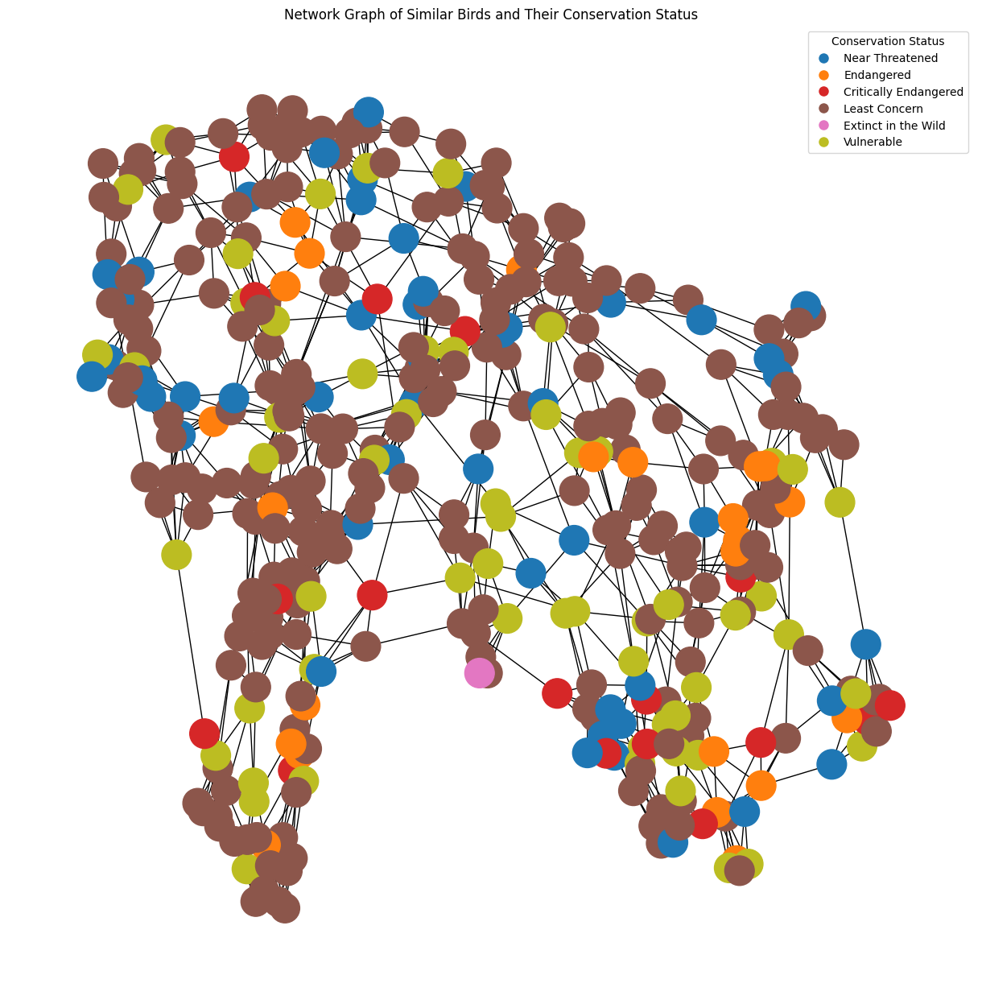

In [37]:
traits = [
    'Beak.Length_Culmen',
    'Beak.Length_Nares',
    'Beak.Width',
    'Beak.Depth',
    'Tarsus.Length',
    'Wing.Length',
    'Kipps.Distance',
    'Hand-Wing.Index',
    'Tail.Length',
    'Mass'
]

from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx

def standardize_traits(df_traits, traits):
    """Standardize/Normalize morphological traits."""
    scaler = StandardScaler()
    standardized_traits = scaler.fit_transform(df_traits[traits])
    species_names = df_traits['scientificName'].values
    return standardized_traits, species_names

def compute_similarity(standardized_traits):
    """
    Compute cosine similarity between species and ensure values are in [-1,1] range.

    Parameters:
        standardized_traits: numpy array of standardized morphological traits
    Returns:
        similarity_matrix: numpy array of pairwise similarities
    """
    # Compute cosine similarity
    similarity_matrix = cosine_similarity(standardized_traits)

    # Clip values to ensure they're in [-1,1] range
    similarity_matrix = np.clip(similarity_matrix, -1, 1)

    # Additional checks
    print("Similarity matrix range:",
          f"min: {similarity_matrix.min():.3f}, max: {similarity_matrix.max():.3f}")

    # Verify similarity range
    if not np.all((similarity_matrix >= -1) & (similarity_matrix <= 1)):
        print("Warning: Original similarity values were outside [-1,1] range")

    return similarity_matrix

def find_similar_birds(similarity_matrix, species_names, df_traits, n_similar=4):
    """Find the most similar birds and their conservation status."""
    similar_birds_info = []

    for i, species in enumerate(species_names):
        # Get similarity scores for the current species
        similarities = similarity_matrix[i]

        # Exclude itself by setting its similarity to -inf
        similarities[i] = -np.inf

        # Find indices of the n most similar species
        similar_indices = np.argsort(similarities)[-n_similar:][::-1]

        # Get species names and conservation statuses
        similar_species = species_names[similar_indices]
        statuses = df_traits.loc[df_traits['scientificName'].isin(similar_species), 'redlistCategory'].values

        # Get the conservation status of the target species
        target_status = df_traits.loc[df_traits['scientificName'] == species, 'redlistCategory'].values[0]

        # Store results
        similar_birds_info.append({
            'Species': species,
            'Similar_Birds': list(similar_species),
            'Target_Status': target_status,
            'Conservation_Statuses': list(statuses)
        })

    return similar_birds_info

def visualize_network(similar_birds_info):
    """Visualize groups of similar birds and their conservation statuses as a network graph."""
    G = nx.Graph()

    # Add nodes and edges
    for info in similar_birds_info:
        species = info['Species']
        target_status = info['Target_Status']
        similar_birds = info['Similar_Birds']
        statuses = info['Conservation_Statuses']

        # Add the target species node
        G.add_node(species, status=target_status)

        # Add similar birds nodes and edges
        for similar_bird, status in zip(similar_birds, statuses):
            G.add_node(similar_bird, status=status)
            G.add_edge(species, similar_bird)

    # Map conservation statuses to colors
    unique_statuses = list(set(nx.get_node_attributes(G, 'status').values()))
    status_color_map = {status: plt.cm.tab10(i / len(unique_statuses)) for i, status in enumerate(unique_statuses)}

    # Assign colors to nodes based on their conservation status
    node_colors = [status_color_map[G.nodes[node]['status']] for node in G.nodes]

    # Draw the graph
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, with_labels=False, node_color=node_colors, edge_color="black", node_size=700, font_size=10)

    # Create a legend
    legend_labels = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
                     for color in status_color_map.values()]
    plt.legend(legend_labels, status_color_map.keys(), loc="best", title="Conservation Status")

    plt.title("Network Graph of Similar Birds and Their Conservation Status")
    plt.show()

# 1. Data Preparation
# Create a copy of the data with species names and morphological traits
# Drop any rows with missing values (NaN)
df_traits = df[['scientificName', 'redlistCategory'] + traits].copy()
df_traits = df_traits.dropna()

# 2. Data Standardization
# StandardScaler transforms features to have mean=0 and variance=1
# This ensures all traits contribute equally regardless of their original scales
standardized_traits, species_names = standardize_traits(df_traits, traits)

# 3. Similarity Calculation
# Compute cosine similarity between all pairs of species
# Result is a square matrix where each cell[i,j] is similarity between species i and j
similarity_matrix = compute_similarity(standardized_traits)

# 4. Find similar birds and their conservation statuses
similar_birds_info = find_similar_birds(similarity_matrix, species_names, df_traits)

# 6. Visualize network
visualize_network(similar_birds_info)